# Product matching

**Цель проекта:**
- разработать модель для нахождения 5 ближайжих соседей - аналогов товара.

**Описание данных:**<br>
Датасет состоит из файлов: 
- тренировочный набор (около 100к записей), где проставлен target - ближайший сосед
- базовый набор (более 2900к записей) - набор для поиска соседей
- валидационный набор - набор для тестирования и проверки выбранной модели

**План работ:**<br>
- загрузка и ознакомление с данными
- предварительная обработка
- полноценный разведочный анализ
- проверка на мультиколлинеарность
- преобразование и отбор признаков
- выбор и обучение моделей
- итоговая оценка качества предсказания лучшей модели

In [3]:
!pip install --user phik -q
!pip install --user shap -q
!pip install sweetviz -q
!pip install --upgrade faiss-cpu -q

In [4]:
#импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display
import seaborn as sns
import phik
from sklearn.model_selection import train_test_split

# загружаем класс pipeline
from sklearn.pipeline import Pipeline

# загружаем классы для подготовки данных
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder
from sklearn.compose import ColumnTransformer

# загружаем класс для работы с пропусками
from sklearn.impute import SimpleImputer

# загружаем функцию для работы с метриками
from sklearn.metrics import f1_score

# импортируем класс RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.base import BaseEstimator, TransformerMixin

# загружаем нужные модели
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC


#import shap

from warnings import simplefilter

import sweetviz as sv
import faiss
from annoy import AnnoyIndex
from time import perf_counter
import logging

In [5]:
pd.set_option('chained_assignment', None)

# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

## Загрузка данных

In [6]:
try:
    data_train = pd.read_csv('../input/train-product/train.csv', sep = ',')
    data_base = pd.read_csv('../input/base-product/base.csv', sep = ',')
except FileNotFoundError:
    print('Файл не найден. Необходимо проверить путь к файлу')
except Exception:
    print('Файл не загрузился')

In [7]:
try:
    data_validation = pd.read_csv('../input/validation-product/validation.csv', sep = ',')
    data_validation_answer = pd.read_csv('../input/validation-answer-product/validation_answer.csv', sep = ',')
except FileNotFoundError:
    print('Файл не найден. Необходимо проверить путь к файлу')
except Exception:
    print('Файл не загрузился')

In [8]:
data_train.head()

,Id,0,1,2,3,4,5,6,7,8,...,63,64,65,66,67,68,69,70,71,Target
0,0-query,-53.882748,17.971436,-42.117104,-183.93668,187.517490,-87.144930,-347.360606,38.307602,109.085560,...,70.107360,-155.80257,-101.965943,65.903790,34.457500,62.642094,134.763600,-415.750254,-25.958572,675816-base
1,1-query,-87.776370,6.806268,-32.054546,-177.26039,120.803330,-83.810590,-94.572749,-78.433090,124.915900,...,4.669178,-151.69771,-1.638704,68.170876,25.096191,89.974976,130.589630,-1035.092211,-51.276833,366656-base
2,2-query,-49.979565,3.841486,-116.118590,-180.40198,190.128430,-50.837620,26.943937,-30.447489,125.771164,...,78.039764,-169.14620,82.144186,66.008220,18.400496,212.409730,121.931470,-1074.464888,-22.547178,1447819-base
3,3-query,-47.810562,9.086598,-115.401695,-121.01136,94.652840,-109.255410,-775.150134,79.186520,124.003100,...,44.515266,-145.41675,93.990981,64.131350,106.061920,83.178760,118.277725,-1074.464888,-19.902788,1472602-base
4,4-query,-79.632126,14.442886,-58.903397,-147.05254,57.127068,-16.239529,-321.317964,45.984676,125.941284,...,45.028910,-196.09207,-117.626337,66.926220,42.456170,77.621765,92.479930,-1074.464888,-21.149351,717819-base


In [9]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 74 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Id      100000 non-null  object 
 1   0       100000 non-null  float64
 2   1       100000 non-null  float64
 3   2       100000 non-null  float64
 4   3       100000 non-null  float64
 5   4       100000 non-null  float64
 6   5       100000 non-null  float64
 7   6       100000 non-null  float64
 8   7       100000 non-null  float64
 9   8       100000 non-null  float64
 10  9       100000 non-null  float64
 11  10      100000 non-null  float64
 12  11      100000 non-null  float64
 13  12      100000 non-null  float64
 14  13      100000 non-null  float64
 15  14      100000 non-null  float64
 16  15      100000 non-null  float64
 17  16      100000 non-null  float64
 18  17      100000 non-null  float64
 19  18      100000 non-null  float64
 20  19      100000 non-null  float64
 21  20      100

In [10]:
data_base.head()

,Id,0,1,2,3,4,5,6,7,8,...,62,63,64,65,66,67,68,69,70,71
0,0-base,-115.083890,11.152912,-64.426760,-118.88089,216.482440,-104.698060,-469.070588,44.348083,120.915344,...,-42.808693,38.800827,-151.76218,-74.389090,63.66634,-4.703861,92.933610,115.269190,-112.756640,-60.830353
1,1-base,-34.562202,13.332763,-69.787610,-166.53348,57.680607,-86.098370,-85.076666,-35.637436,119.718636,...,-117.767525,41.100000,-157.82940,-94.446806,68.20211,24.346846,179.937930,116.834000,-84.888941,-59.524610
2,2-base,-54.233746,6.379371,-29.210136,-133.41383,150.895830,-99.435326,52.554795,62.381706,128.951450,...,-76.397800,46.011803,-207.14442,127.325570,65.56618,66.325680,81.073490,116.594154,-1074.464888,-32.527206
3,3-base,-87.520130,4.037884,-87.803030,-185.06763,76.369540,-58.985165,-383.182845,-33.611237,122.031910,...,-70.647940,-6.358921,-147.20105,-37.692750,66.20289,-20.566910,137.206940,117.474100,-1074.464888,-72.915490
4,4-base,-72.743850,6.522049,43.671265,-140.60803,5.820023,-112.074080,-397.711282,45.182500,122.167180,...,-57.199104,56.642403,-159.35184,85.944724,66.76632,-2.505783,65.315285,135.051590,-1074.464888,0.319401


In [11]:
data_base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2918139 entries, 0 to 2918138
Data columns (total 73 columns):
 #   Column  Dtype  
---  ------  -----  
 0   Id      object 
 1   0       float64
 2   1       float64
 3   2       float64
 4   3       float64
 5   4       float64
 6   5       float64
 7   6       float64
 8   7       float64
 9   8       float64
 10  9       float64
 11  10      float64
 12  11      float64
 13  12      float64
 14  13      float64
 15  14      float64
 16  15      float64
 17  16      float64
 18  17      float64
 19  18      float64
 20  19      float64
 21  20      float64
 22  21      float64
 23  22      float64
 24  23      float64
 25  24      float64
 26  25      float64
 27  26      float64
 28  27      float64
 29  28      float64
 30  29      float64
 31  30      float64
 32  31      float64
 33  32      float64
 34  33      float64
 35  34      float64
 36  35      float64
 37  36      float64
 38  37      float64
 39  38      float64
 40  

Загрузили данные из таблиц data_train и data_base.<br>
В таблице data_train 100 тыс. строк. В таблице data_base 2918 тыс. строк.

In [12]:
data_validation.head()

,Id,0,1,2,3,4,5,6,7,8,...,62,63,64,65,66,67,68,69,70,71
0,100000-query,-57.372734,3.597752,-13.213642,-125.92679,110.74594,-81.279594,-461.003172,139.815720,112.880980,...,-75.51302,52.830902,-143.43945,59.051935,69.28224,61.927513,111.59253,115.140656,-1099.130485,-117.079360
1,100001-query,-53.758705,12.790300,-43.268543,-134.41762,114.44991,-90.520130,-759.626065,63.995087,127.117905,...,-79.44183,29.185436,-168.60590,-82.872443,70.76560,-65.975950,97.07716,123.391640,-744.442332,-25.009320
2,100002-query,-64.175095,-3.980927,-7.679249,-170.16093,96.44616,-62.377740,-759.626065,87.477554,131.270110,...,-134.79541,37.368730,-159.66231,-119.232725,67.71044,86.002060,137.63641,141.081630,-294.052271,-70.969604
3,100003-query,-99.286860,16.123936,9.837166,-148.06044,83.69708,-133.729720,58.576403,-19.046660,115.042404,...,-77.23611,44.100494,-132.53012,-106.318982,70.88396,23.577892,133.18396,143.252940,-799.363667,-89.392670
4,100004-query,-79.532920,-0.364173,-16.027431,-170.88495,165.45392,-28.291668,33.931936,34.411217,128.903980,...,-123.77025,45.635944,-134.25893,13.735359,70.61763,15.332115,154.56812,101.700640,-1171.892332,-125.307890


In [13]:
data_validation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 73 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Id      100000 non-null  object 
 1   0       100000 non-null  float64
 2   1       100000 non-null  float64
 3   2       100000 non-null  float64
 4   3       100000 non-null  float64
 5   4       100000 non-null  float64
 6   5       100000 non-null  float64
 7   6       100000 non-null  float64
 8   7       100000 non-null  float64
 9   8       100000 non-null  float64
 10  9       100000 non-null  float64
 11  10      100000 non-null  float64
 12  11      100000 non-null  float64
 13  12      100000 non-null  float64
 14  13      100000 non-null  float64
 15  14      100000 non-null  float64
 16  15      100000 non-null  float64
 17  16      100000 non-null  float64
 18  17      100000 non-null  float64
 19  18      100000 non-null  float64
 20  19      100000 non-null  float64
 21  20      100

In [14]:
data_validation_answer.head()

,Id,Expected
0,100000-query,2676668-base
1,100001-query,91606-base
2,100002-query,472256-base
3,100003-query,3168654-base
4,100004-query,75484-base


In [15]:
data_validation_answer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   Id        100000 non-null  object
 1   Expected  100000 non-null  object
dtypes: object(2)
memory usage: 1.5+ MB


##  Предобработка данных и исследовательский анализ

### Исследование таблицы data_base

In [16]:
#Проверка на пропуски в данных
data_train.isna().sum().max()

0

Пропусков в столбцах в таблице data_train нет.

In [17]:
# проверка на явные дубликаты
data_train.duplicated().sum()

0

Явных дубликатов тоже нет.

In [18]:
report = sv.analyze([data_train, "Report"])

                                             |          | [  0%]   00:00 -> (? left)

In [19]:
report.show_html('product matching analysis data_train.html')

Report product matching analysis data_train.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



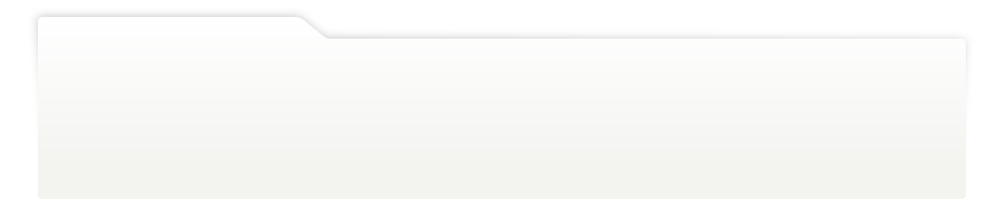
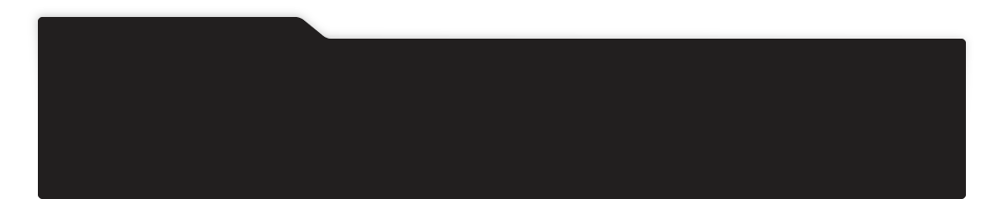
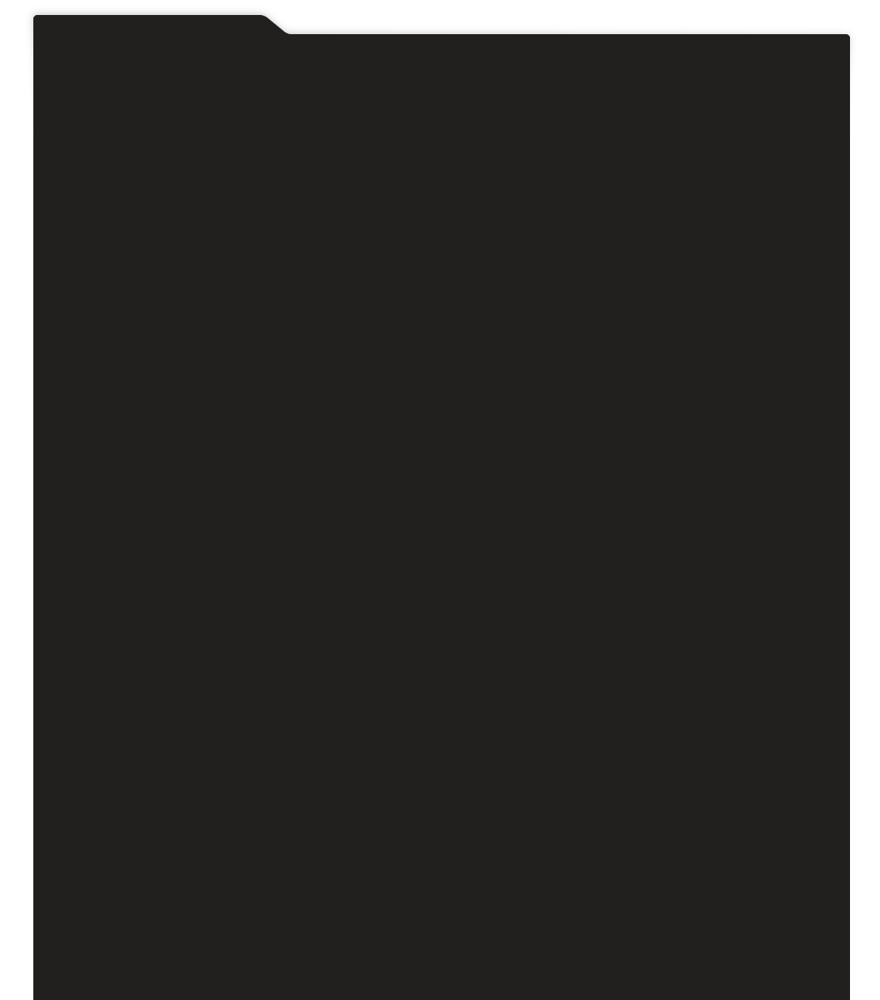
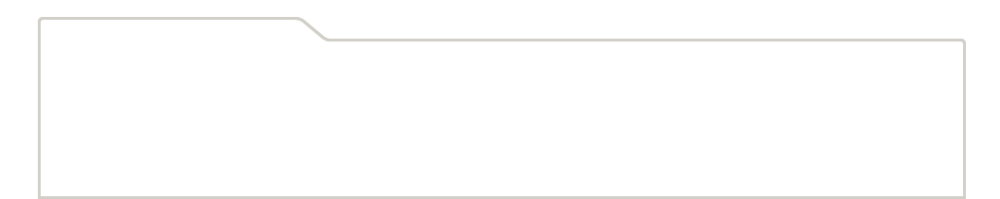
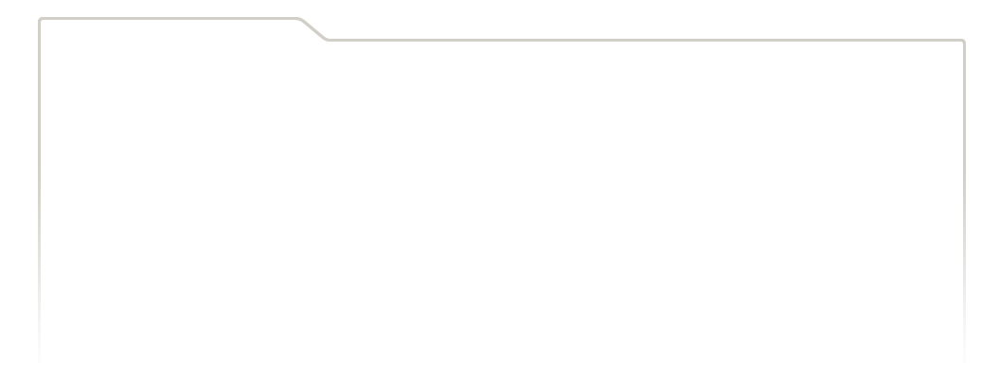
...
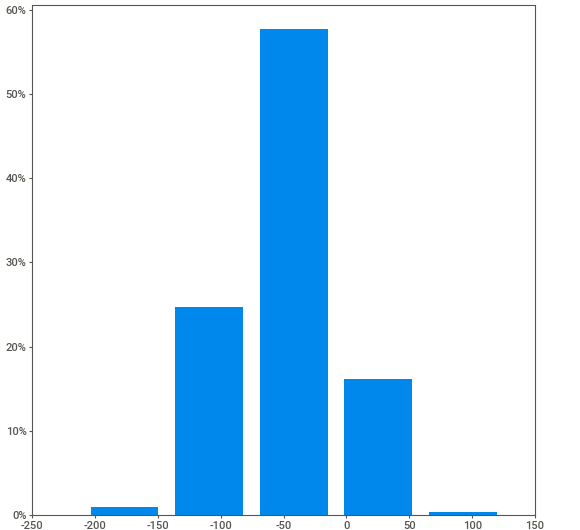
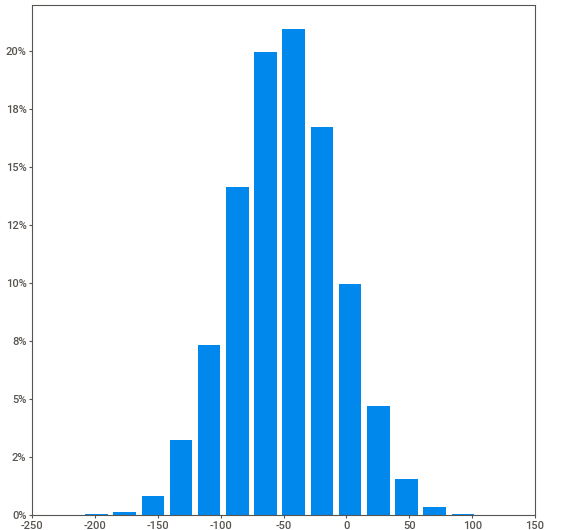
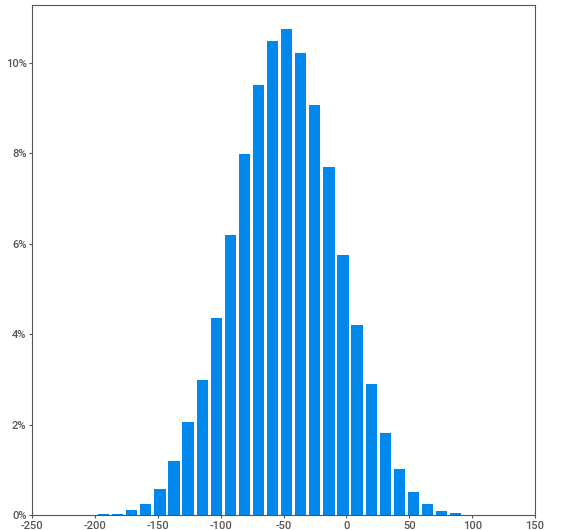
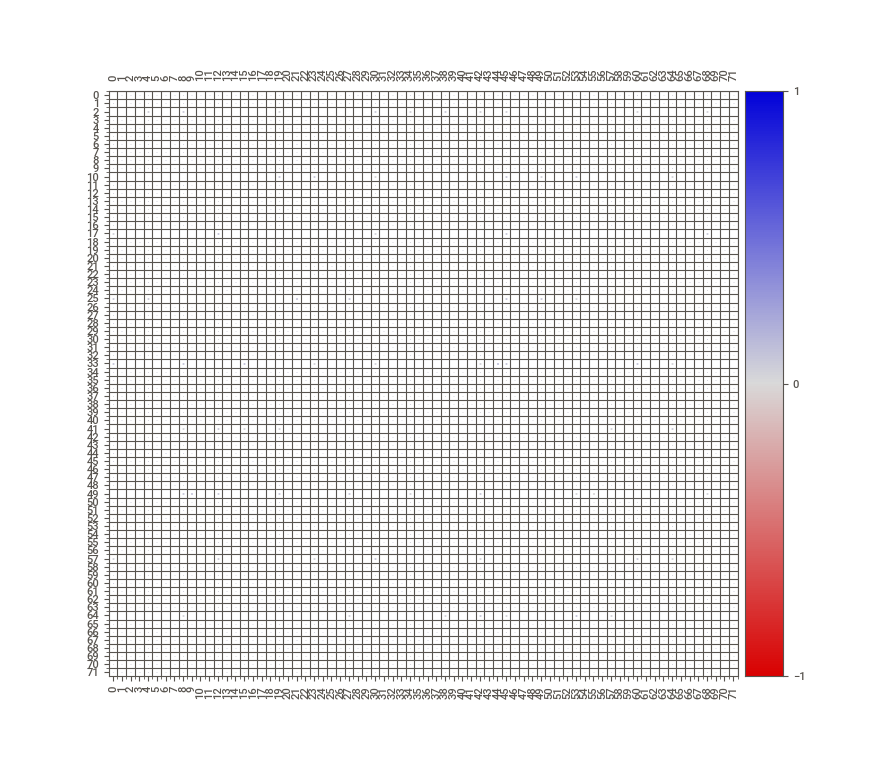
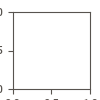

In [20]:
report.show_notebook()

In [21]:
pd.set_option("display.max_columns", 74)

In [22]:
data_train.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,-85.328679,7.664345,-43.667046,-146.118630,111.770592,-73.178792,-440.615118,21.231588,123.067891,126.120201,-141.168584,-69.228444,-42.559541,6.506719,149.077582,-23.942253,-2.219093,-12.964439,-138.714610,-79.159795,-97.474574,1297.269578,-3.600685,55.908014,23.470181,742.788817,-64.970553,16.368072,-86.201170,152.098083,-13.659323,-144.506022,89.747894,-587.551768,36.468210,73.109595,-13.866967,-146.487267,-118.336458,-41.131969,-9.261504,4.139978,-104.928806,122.240784,-40.320211,59.051981,-84.054387,-140.787854,46.137851,-34.136875,29.462927,-22.343451,67.581086,-120.052756,88.193676,69.538752,-132.336967,14.452681,-120.301843,-315.282239,-66.378660,-130.672183,-81.145553,36.898233,-152.223082,14.001695,67.799560,23.029277,73.412076,115.189717,-709.761548,-48.505704
std,25.803845,4.955651,39.111064,20.434841,47.700958,28.718853,279.017550,65.985214,6.492081,64.912752,41.607785,51.258647,40.819544,37.593800,34.167843,13.024184,20.978943,55.210920,48.737245,0.775560,28.382144,375.123794,50.063680,35.617513,40.802653,191.052074,63.160650,4.828575,49.511818,10.392531,29.191689,35.816357,28.312124,273.294442,39.756311,20.008170,25.824911,10.383975,13.578397,19.868303,8.295381,5.922103,56.519443,48.109909,14.739497,31.088173,66.055063,59.851232,46.328286,59.325454,60.934591,54.991787,12.988132,55.920785,4.824051,12.339684,7.952113,49.234745,55.730177,210.657513,64.913422,9.408099,30.675871,25.357686,41.020285,99.079597,1.838012,55.470761,62.203132,21.582238,405.961084,41.215124
min,-186.280270,-11.560507,-224.896060,-223.307220,-93.272020,-184.962450,-791.469482,-278.582820,94.831150,-142.156950,-330.570600,-352.405200,-214.742460,-145.860280,8.818390,-82.645004,-91.657020,-247.589280,-326.648740,-82.637184,-228.808260,136.873137,-211.971800,-87.323780,-122.584274,-61.803358,-338.562500,-6.629074,-285.668700,111.387250,-130.444920,-290.124000,-25.550720,-1044.135662,-119.903810,-11.926712,-124.560380,-193.918150,-166.078460,-123.062420,-43.063824,-18.980648,-324.943570,-67.540375,-63.102401,-64.789690,-327.322720,-365.060880,-129.879180,-280.371830,-250.337570,-236.148470,18.477040,-354.915700,66.068665,18.104557,-161.189320,-183.849880,-330.638180,-681.029305,-358.460450,-169.566400,-210.059310,-60.779335,-317.831670,-157.590189,60.668890,-203.746380,-181.973820,22.598862,-1297.871984,-209.935760
25%,-103.309147,4.313784,-69.494487,-160.028520,79.474322,-92.834080,-738.536868,-22.131764,118.674642,82.545028,-168.599020,-103.048815,-69.801705,-18.815189,126.369124,-32.379752,-16.455603,-49.612492,-171.661355,-79.656816,-115.407545,1248.126198,-37.047511,31.436791,-5.051067,813.770071,-106.860569,13.187895,-119.613590,145.143008,-32.812503,-168.535163,70.432237,-803.390708,9.505674,59.978086,-30.926924,-153.339210,-127.603408,

У признаков 6,21, 25, 33, 59, 65, 70 распределение отличается от нормального, у других признаков распределение некоторым образом похоже на нормальное.<br>
Пропусков в столбцах нет и явных дубликатов тоже.<br>
Все признаки здесь количественные, всего 72 признака. У них разный масштаб.<br>
Стандартное отклонение у всех признаков довольно разное. Маленький разброс наблюдается у признаков 19 и 66.

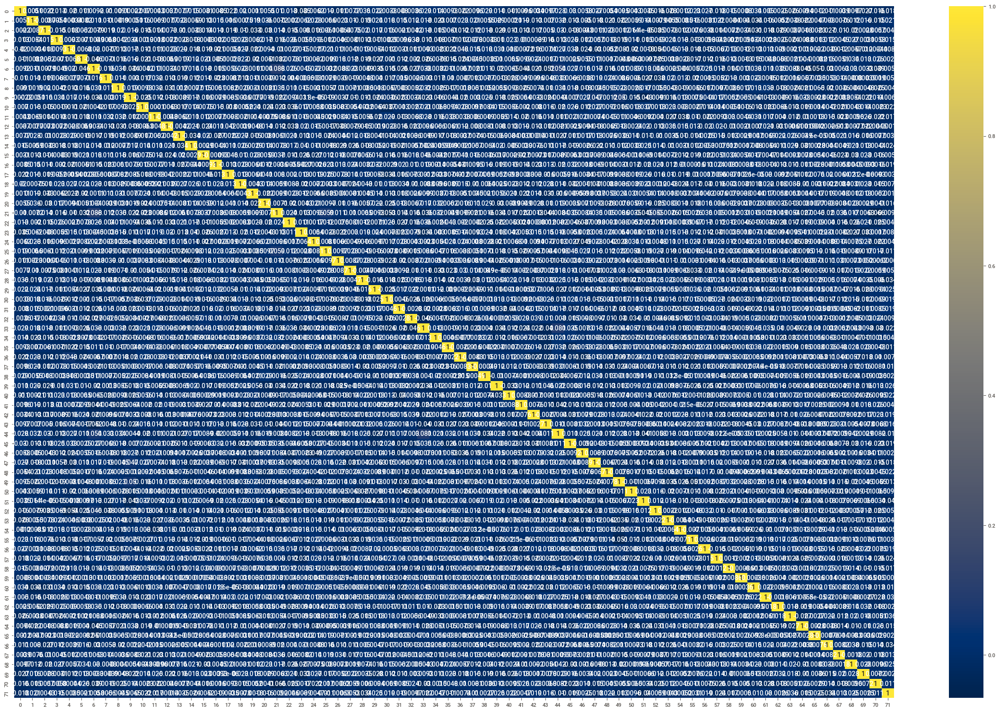

In [23]:
fig, ax = plt.subplots(figsize=(30,19));
sns.heatmap(data_train.drop(['Id', 'Target'], axis = 1).corr(), annot=True, cmap='cividis', ax = ax);

Сявзи между признаками на матрице корреляции не обнаружено.

### Исследование таблицы data_base

In [24]:
#Проверка на пропуски в данных
data_base.isna().sum().max()

0

In [25]:
# проверка на явные дубликаты
data_base.duplicated().sum()

0

Пропусков и дубликатов в таблице data_base не обнаружено.

In [26]:
data_base.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71
count,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06,2.918139e+06
mean,-8.622947e+01,8.080077e+00,-4.458080e+01,-1.466350e+02,1.113166e+02,-7.199138e+01,-3.922239e+02,2.035283e+01,1.236842e+02,1.244581e+02,-1.431396e+02,-6.988662e+01,-4.126493e+01,7.587780e+00,1.489852e+02,-2.316701e+01,-9.366916e-01,-1.931312e+01,-1.372712e+02,-7.918932e+01,-9.825383e+01,1.257528e+03,-6.824936e+00,5.667382e+01,2.669563e+01,7.271026e+02,-6.625340e+01,1.631537e+01,-8.637482e+01,1.517346e+02,-1.160764e+01,-1.442328e+02,8.721997e+01,-5.541608e+02,3.623933e+01,7.519918e+01,-1.648670e+01,-1.466421e+02,-1.185122e+02,-4.187896e+01,-9.482269e+00,4.050654e+00,-1.127440e+02,1.208653e+02,-3.980939e+01,5.893878e+01,-8.488885e+01,-1.384695e+02,4.792759e+01,-3.238229e+01,2.658408e+01,-2.171709e+01,6.699684e+01,-1.178976e+02,8.802818e+01,6.920454e+01,-1.329056e+02,1.322645e+01,-1.195996e+02,-3.160935e+02,-6.494332e+01,-1.306677e+02,-7.902286e+01,3.329735e+01,-1.547962e+02,1.415132e+01,6.779167e+01,2.354490e+01,7.495930e+01,1.155667e+02,-7.993390e+02,-4.779125e+01
std,2.489132e+01,4.953387e+00,3.863166e+01,1.984480e+01,4.634809e+01,2.818607e+01,2.716550e+02,6.421638e+01,6.356109e+00,6.443058e+01,4.168737e+01,5.121991e+01,3.896358e+01,3.659725e+01,3.363559e+01,1.307563e+01,2.083201e+01,5.297210e+01,4.662566e+01,7.574403e-01,2.815861e+01,3.999612e+02,5.197251e+01,3.436061e+01,3.894157e+01,2.055724e+02,6.153334e+01,4.656628e+00,4.851313e+01,1.009000e+01,2.895059e+01,3.475739e+01,2.785556e+01,2.606486e+02,3.989506e+01,2.144713e+01,2.585462e+01,9.953913e+00,1.314411e+01,1.919689e+01,8.190720e+00,5.835750e+00,5.694050e+01,4.671995e+01,1.474482e+01,3.211030e+01,6.319335e+01,5.773822e+01,4.520157e+01,5.828693e+01,5.895291e+01,5.173898e+01,1.307173e+01,5.470584e+01,4.774309e+00,1.194907e+01,7.815245e+00,5.107988e+01,5.524317e+01,2.106644e+02,6.248236e+01,9.569063e+00,3.045642e+01,2.888603e+01,4.122929e+01,9.895115e+01,1.823356e+00,5.534224e+01,6.134500e+01,2.117518e+01,3.854131e+02,4.174802e+01
min,-1.994687e+02,-1.391461e+01,-2.400734e+02,-2.326671e+02,-1.055830e+02,-2.110086e+02,-7.914699e+02,-3.018597e+02,9.315305e+01,-1.738719e+02,-3.438436e+02,-3.684526e+02,-2.260906e+02,-1.756239e+02,-1.526698e+01,-8.591711e+01,-9.636816e+01,-2.725656e+02,-3.517478e+02,-8.315235e+01,-2.437279e+02,1.368182e+02,-2.382874e+02,-8.818329e+01,-1.431833e+02,-6.198046e+01,-3.585515e+02,-8.364693e+00,-3.140082e+02,1.074433e+02,-1.567305e+02,-2.986792e+02,-3.465488e+01,-1.045312e+03,-1.378509e+02,-2.151936e+01,-1.379866e+02,-1.954172e+02,-1.769110e+02,-1.327073e+02,-4.757769e+01,-2.158085e+01,-3.381192e+02,-8.770834e+01,-6.310310e+01,-7.724959e+01,-3.629306e+02,-4.186953e+02,-1.453876e+02,-3.228121e+02,-2.802731e+02,-2.646334e+02,6.196133e+00,-3.812643e+02,6.558115e+01,1.408166e+01,-1.670627e+02,-1.961836e+02,-3.597054e+02,-6.810424e+02,-4.007911e+02,-1.713491e+02,-2.205662e+02,-8.850774e+01,-3.539028e+02,-1.575944e+02,5.95094

## Преобразование и обработка признаков

Удалим признаки, распределение которых далеко от нормального и выбивается из общей картины.

In [8]:
data_train = data_train.drop(['6', '21', '25', '33',  '59', '65', '70'], axis = 1)
data_base = data_base.drop(['6', '21', '25', '33', '59', '65', '70'], axis = 1)

Id перенесем в индексы для дальнейшего корретного поиска.

In [9]:
data_train['Id'] = data_train['Id'].str.replace('-query','')

In [10]:
data_train = data_train.set_index('Id')

In [11]:
data_train

,0,1,2,3,4,5,7,8,9,10,...,61,62,63,64,66,67,68,69,71,Target
Id,,,,,,,,,,,,,,,,,,,,,
0,-53.882748,17.971436,-42.117104,-183.936680,187.517490,-87.144930,38.307602,109.085560,30.413513,-88.082690,...,-132.386170,-105.427820,70.107360,-155.802570,65.903790,34.457500,62.642094,134.763600,-25.958572,675816-base
1,-87.776370,6.806268,-32.054546,-177.260390,120.803330,-83.810590,-78.433090,124.915900,140.331070,-177.605800,...,-137.411360,-40.812233,4.669178,-151.697710,68.170876,25.096191,89.974976,130.589630,-51.276833,366656-base
2,-49.979565,3.841486,-116.118590,-180.401980,190.128430,-50.837620,-30.447489,125.771164,211.607820,-86.346560,...,-139.223070,-52.031662,78.039764,-169.146200,66.008220,18.400496,212.409730,121.931470,-22.547178,1447819-base
3,-47.810562,9.086598,-115.401695,-121.011360,94.652840,-109.255410,79.186520,124.003100,242.650650,-146.517070,...,-131.198290,-61.567047,44.515266,-145.416750,64.131350,106.061920,83.178760,118.277725,-19.902788,1472602-base
4,-79.632126,14.442886,-58.903397,-147.052540,57.127068,-16.239529,45.984676,125.941284,103.392670,-107.153020,...,-103.341700,-68.770600,45.028910,-196.092070,66.926220,42.456170,77.621765,92.479930,-21.149351,717819-base
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,-68.180530,11.657515,-63.179720,-188.726530,131.113100,-65.125340,95.990750,118.761185,-5.635696,-121.467606,...,-139.989930,-53.422020,38.573555,-133.087130,66.477340,-36.148730,61.689774,107.037950,-35.128250,811868-base
99996,-66.540890,2.201112,-70.292114,-146.167850,77.817140,-47.525654,-25.183374,131.499820,183.260880,-74.741936,...,-120.659004,-114.631840,33.324960,-110.576416,65.818100,-30.268772,133.784000,154.495860,-108.663510,1460772-base
99997,-53.948240,4.726887,-29.278950,-147.182830,264.090670,-101.135630,68.057560,118.084310,192.449250,-207.982570,...,-147.090560,-74.836655,-14.146965,-184.663830,67.347800,110.437100,35.785603,111.616710,-4.270569,2366140-base


Выделим y_train - target, т.е. ближайшего соседа из data_base

In [12]:
y_train = data_train['Target']
data_train = data_train.drop(['Target'], axis = 1)

In [13]:
y_train = y_train.str.replace('-base','')

In [14]:
y_train

Id
0         675816
1         366656
2        1447819
3        1472602
4         717819
          ...   
99995     811868
99996    1460772
99997    2366140
99998       9252
99999    2769109
Name: Target, Length: 100000, dtype: object

In [15]:
data_train.head()

,0,1,2,3,4,5,7,8,9,10,...,60,61,62,63,64,66,67,68,69,71
Id,,,,,,,,,,,,,,,,,,,,,
0,-53.882748,17.971436,-42.117104,-183.93668,187.517490,-87.144930,38.307602,109.085560,30.413513,-88.08269,...,-77.029590,-132.38617,-105.427820,70.107360,-155.80257,65.903790,34.457500,62.642094,134.763600,-25.958572
1,-87.776370,6.806268,-32.054546,-177.26039,120.803330,-83.810590,-78.433090,124.915900,140.331070,-177.60580,...,21.459618,-137.41136,-40.812233,4.669178,-151.69771,68.170876,25.096191,89.974976,130.589630,-51.276833
2,-49.979565,3.841486,-116.118590,-180.40198,190.128430,-50.837620,-30.447489,125.771164,211.607820,-86.34656,...,-72.830000,-139.22307,-52.031662,78.039764,-169.14620,66.008220,18.400496,212.409730,121.931470,-22.547178
3,-47.810562,9.086598,-115.401695,-121.01136,94.652840,-109.255410,79.186520,124.003100,242.650650,-146.51707,...,-153.465770,-131.19829,-61.567047,44.515266,-145.41675,64.131350,106.061920,83.178760,118.277725,-19.902788
4,-79.632126,14.442886,-58.903397,-147.05254,57.127068,-16.239529,45.984676,125.941284,103.392670,-107.15302,...,-127.747860,-103.34170,-68.770600,45.028910,-196.09207,66.926220,42.456170,77.621765,92.479930,-21.149351


Аналогично преобразуем data_base

In [16]:
data_base['Id'] = data_base['Id'].str.replace('-base','')
data_base = data_base.set_index('Id')
data_base.head()

,0,1,2,3,4,5,7,8,9,10,...,60,61,62,63,64,66,67,68,69,71
Id,,,,,,,,,,,,,,,,,,,,,
0,-115.083890,11.152912,-64.426760,-118.88089,216.482440,-104.698060,44.348083,120.915344,181.449700,-124.06151,...,-64.518950,-138.77763,-42.808693,38.800827,-151.76218,63.66634,-4.703861,92.933610,115.269190,-60.830353
1,-34.562202,13.332763,-69.787610,-166.53348,57.680607,-86.098370,-35.637436,119.718636,195.234190,-141.30435,...,11.392853,-148.57166,-117.767525,41.100000,-157.82940,68.20211,24.346846,179.937930,116.834000,-59.524610
2,-54.233746,6.379371,-29.210136,-133.41383,150.895830,-99.435326,62.381706,128.951450,164.381470,-140.82245,...,-101.581375,-134.65822,-76.397800,46.011803,-207.14442,65.56618,66.325680,81.073490,116.594154,-32.527206
3,-87.520130,4.037884,-87.803030,-185.06763,76.369540,-58.985165,-33.611237,122.031910,136.233580,-108.47044,...,-89.588715,-149.32669,-70.647940,-6.358921,-147.20105,66.20289,-20.566910,137.206940,117.474100,-72.915490
4,-72.743850,6.522049,43.671265,-140.60803,5.820023,-112.074080,45.182500,122.167180,112.119064,-110.34245,...,-100.565520,-125.31733,-57.199104,56.642403,-159.35184,66.76632,-2.505783,65.315285,135.051590,0.319401


In [17]:
scaler = StandardScaler()
data_base_index = data_base.index
data_train_index = data_train.index
#data_validation_index = data_validation.index
data_base = pd.DataFrame(scaler.fit_transform(data_base), index=data_base_index)
data_train = pd.DataFrame(scaler.transform(data_train), index=data_train_index)
#data_validation = pd.DataFrame(scaler.transform(data_validation), index=data_validation_index)

## Подбор модели

In [18]:
# полная версия функции
K =5
def get_accuracy(df, df_eval, target,
                 model_type = None,
                 faiss_n_clust = None,
                 faiss_index = None,
                 faiss_metric = None,
                 faiss_train_sample_size = None,
                 faiss_pca_dims = None,
                 faiss_ef_search = 32,
                 annoy_distance_type = 'euclidean',
                 annoy_n_trees = 10,
                 annoy_search_n_nodes = -1,
                 k_similar = K,
                 SEED = 42):
    '''
    Builds index with specified model(s). Calculates accuracy@k.
    Arguments.
    - df : pd.DataFrame. Dataframe to find similars in.
    - df_eval : pd.DataFrame. Dataframe with samples to find similars for.
    - target : pd.Series or array. Columns with answers for df_eval.
    - model_type : str | list. Either 'faiss' or 'annoy' or both in list.
    - FAISS:
        - faiss_n_clust : int. Number of clusters for FAISS.
        - faiss_index : str. Type of index to build.
          Accepts:
        - 'ivf_flat' for IVFFlat index;
        - 'ivf_hnsw' for IVFHNSWFlat index with assignable number of clusters
          and entry points.
        - faiss_metric : str. Metric / distance type for FAISS.
          For IVFFLAT index accepts:
          - 'euclidean';
          - 'mahalanobis';
          - 'cosine';
          - 'mips' - maximum inner product search.
        - faiss_train_sample_size : int. FAISS train sample size.
        - faiss_pca_dims : int. If present, PCA dimensionality reduction is
          performed with the specified number of desired output features.
        - faiss_ef_search : int. Number of entry points for IVFHNSW index.
    - ANNOY:
        - annoy_distance_type : str.
          Accepts:
          - 'euclidean';
          - 'angular' for cosine distance;
          - 'manhattan';
          - 'hamming';
          - 'dot'.
        - annoy_n_trees : int. Number of trees for ANNOY index.
        - annoy_search_n_nodes : int. Number of nodes to search.
    - k_similar : int. Number of similar objects t search for.
    - SEED : any. RNG seed.
    '''

    # Изменим формат типа модели при необходимости.
    model_type = [model_type] if isinstance(model_type, str) else model_type

    # Определим длину вектора признаков.
    dims = df.shape[1]

    # Определим базовый индекс.
    base_index = {k: v for k, v in enumerate(df.index.to_list())}
 
    # Инициализируем переменные для результатов
    acc_faiss = 0
    time_faiss = 0
    acc_annoy = 0
    time_annoy = 0
    idx = None

    # FAISS
    if 'faiss' in model_type:
        # FAISS с PCA
        if faiss_pca_dims:
            # Снизим размерность данных и приведём данные в соответстие faiss.
            pca_matrix = faiss.PCAMatrix(dims, faiss_pca_dims)
            pca_matrix.train(df)
            assert pca_matrix.is_trained
            df_arr = pca_matrix.apply(df)
            df_eval_arr = pca_matrix.apply(df_eval)

            dims = faiss_pca_dims

        # FAISS с индексом IVFFLAT.
        if faiss_index == 'ivf_flat':
            # Определим квантизатор.
            quantizer = faiss.IndexFlatL2(dims)

            # FAISS с расстоянием Махаланобиса.
            if faiss_metric == 'mahalanobis':
                if faiss_pca_dims:
                    df = df_arr
                    df_eval = df_eval_arr
                # Вычислим матрицу ковариации.
                df_c = df - df.mean(0)
                cov = np.dot(df_c.T, df_c) / df_c.shape[0]

                # Преобразуем ковариационную матрицу.
                L = np.linalg.cholesky(cov)
                mahalanobis_transform = np.linalg.inv(L)

                # Функция преобразования данных.
                def inverse_cholesky_cov(df, mahalanobis_transform):
                    df_trans = np.dot(df, mahalanobis_transform.T)
                    return df_trans.astype('float32')

                # Преобразуем данные.
                df_arr = inverse_cholesky_cov(df,
                                              mahalanobis_transform)
                df_eval_arr = inverse_cholesky_cov(df_eval,
                                                   mahalanobis_transform)

                # Определим индекс.
                faiss_index = faiss.IndexIVFFlat(quantizer,
                                                 dims,
                                                 faiss_n_clust,
                                                 faiss.METRIC_L2)

            else:
                if not faiss_pca_dims:
                    # Приведём данные в соответстие faiss.
                    df_arr = np.ascontiguousarray(df.values).astype('float32')
                    df_eval_arr = (
                        np.ascontiguousarray(df_eval.values).astype('float32')
                        )

                # FAISS с косинусным расстоянием.
                if faiss_metric == 'cosine':

                    # Нормализуем векторы.
                    faiss.normalize_L2(df_arr)
                    faiss.normalize_L2(df_eval_arr)

                    # Определим индекс.
                    faiss_index = faiss.IndexIVFFlat(quantizer,
                                                    dims,
                                                    faiss_n_clust,
                                                    faiss.METRIC_INNER_PRODUCT)

                # FAISS с поиском максимального скалярного произведения.
                elif faiss_metric == 'mips':

                    # Определим индекс.
                    faiss_index = faiss.IndexIVFFlat(quantizer,
                                                    dims,
                                                    faiss_n_clust,
                                                    faiss.METRIC_INNER_PRODUCT)

                # FAISS с Евклидовым расстоянием.
                elif faiss_metric == 'euclidean':

                    # Определим индекс.
                    faiss_index = faiss.IndexIVFFlat(quantizer,
                                                    dims,
                                                    faiss_n_clust)

                else:
                    raise ValueError('Другие метрики "FAISS" не '+
                                     'поддерживаются.')

        # FAISS с индексом IVF_HNSW64.
        elif faiss_index == 'ivf_hnsw':
            # Приведём данные в соответстие faiss.
            df_arr = np.ascontiguousarray(df.values).astype('float32')
            df_eval_arr = (
                np.ascontiguousarray(df_eval.values).astype('float32')
                )

            # Определим индекс.
            faiss_index = faiss.index_factory(dims,
                                              (f'IVF{faiss_n_clust}_HNSW'+
                                               f'{faiss_ef_search}'+',Flat'))
            faiss_index.nprobe = 8

        start_faiss = perf_counter()

        faiss_index.train(df_arr[:faiss_train_sample_size, :])
        faiss_index.add(df_arr)

        # Построим индекс.
        vecs, idx = faiss_index.search(df_eval_arr, k_similar)

        # Вычислим целевую метрику accuracy@k для FAISS.
        acc_faiss = 0
        for t, el in zip(target.values.tolist(), idx):
            acc_faiss += int(t in [base_index[r] for r in el])

        # Вычислим время выполнения.
        time_faiss = perf_counter() - start_faiss
        print("Search Results Indices:", idx[:10])
        print("Search Results Vectors:", vecs[:10])

    # ANNOY
    if 'annoy' in model_type:

        # Определим индекс ANNOY.
        annoy_index = AnnoyIndex(dims, annoy_distance_type)
        annoy_index.set_seed(SEED)
        # Добавим векторы и их индексы.
        for i, v in zip(range(df.shape[0]), df.values):
            annoy_index.add_item(i, v)

        # Построим индекс.
        annoy_index.build(annoy_n_trees, n_jobs=-1)

        start_annoy = perf_counter()

        # Получим K похожих элементов для каждого запроса и собрём в список.
        idx = []
        for v in df_eval.values:
            idx.append(annoy_index.get_nns_by_vector(
                v,
                k_similar,
                search_k=annoy_search_n_nodes)
            )

        # Вычислим целевую метрику accuracy@k для ANNOY.
        acc_annoy = 0
        for t, el in zip(target.values.tolist(), idx):
            acc_annoy += int(t in [base_index[r] for r in el])

        # Вычислим время выполнения.
        time_annoy = perf_counter() - start_annoy

    # Выведем метрику и время исполнения для каждого/всех алгоритмов.
    if model_type == ['faiss']:
        return (round((100 * acc_faiss / len(idx)), 3),
                     round(time_faiss, 2))
    elif model_type == ['annoy']:
        return (round((100 * acc_annoy / len(idx)), 3), round(time_annoy, 2))
    elif all(model in model_type for model in ['faiss', 'annoy']):
        return (round((100 * acc_faiss / len(idx)), 3), round(time_faiss, 2),
                round((100 * acc_annoy / len(idx)), 3), round(time_annoy, 2))

In [38]:
metrics_result = []
for n_clust in [25, 50, 100, 200]:
    for metric in ['euclidean', 'mahalanobis', 'cosine', 'mips']:
#for n_clust in [100]:
#    for metric in ['mahalanobis']:
        for index in ['ivf_flat', 'ivf_hnsw']:
            acc_faiss, time_faiss = get_accuracy(data_base, data_train, y_train,
                 model_type = 'faiss',
                 faiss_index = index,
                 faiss_metric = metric,
                 faiss_n_clust = n_clust,
                 faiss_train_sample_size = int(data_base.shape[0] * .1)
                 #faiss_pca_dims = None
                 )
            metrics_result.append([index, metric, n_clust, acc_faiss, time_faiss])

Search Results Indices: [[ 792610 1472986  854264  547719  233844]
 [  15185  519311  737853  223456 2524968]
 [1162532  173120 1532675 2863071  955831]
 [1179186  556881  309511 1949658  209990]
 [ 631912  726816 1304565  351177 2383688]
 [1742186 1244701  546386  564269 2214365]
 [   3917    5251   20584  137521  171555]
 [   8102   22314   60567  171625  176066]
 [  24016  345943  104092 1503861 1497740]
 [ 677269  766968   97888  138570 1708412]]
Search Results Vectors: [[1.6999596e+01 1.7043213e+01 2.1058609e+01 2.1343887e+01 2.2173578e+01]
 [1.1241130e+01 1.3653677e+01 1.7988260e+01 2.2943649e+01 2.2943649e+01]
 [1.4890220e+01 1.5545465e+01 1.8971052e+01 1.9049414e+01 1.9481228e+01]
 [1.0316557e+01 3.1939157e+01 3.7171127e+01 3.7869904e+01 3.8032059e+01]
 [1.4995778e-06 5.1389325e-01 1.3047773e+00 1.6236800e+00 1.7396346e+00]
 [0.0000000e+00 3.0904957e+01 3.2383751e+01 3.3088055e+01 3.4529972e+01]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
 [0.000000

In [1]:
print('Индекс, расстояние, количество кластеров, accuracy@5, время обучения')

Индекс, расстояние, количество кластеров, accuracy@5, время обучения


In [42]:
metrics_result

[['ivf_flat', 'euclidean', 25, 62.738, 161.87],
 ['ivf_hnsw', 'euclidean', 25, 70.328, 1383.45],
 ['ivf_flat', 'mahalanobis', 25, 63.171, 172.09],
 ['ivf_hnsw', 'mahalanobis', 25, 70.328, 1390.61],
 ['ivf_flat', 'cosine', 25, 62.791, 133.56],
 ['ivf_hnsw', 'cosine', 25, 70.328, 1395.41],
 ['ivf_flat', 'mips', 25, 59.947, 133.25],
 ['ivf_hnsw', 'mips', 25, 70.328, 1391.67],
 ['ivf_flat', 'euclidean', 50, 62.731, 74.5],
 ['ivf_hnsw', 'euclidean', 50, 70.089, 653.78],
 ['ivf_flat', 'mahalanobis', 50, 62.861, 75.93],
 ['ivf_hnsw', 'mahalanobis', 50, 70.089, 661.61],
 ['ivf_flat', 'cosine', 50, 62.673, 69.09],
 ['ivf_hnsw', 'cosine', 50, 70.089, 662.18],
 ['ivf_flat', 'mips', 50, 59.856, 69.13],
 ['ivf_hnsw', 'mips', 50, 70.089, 660.1],
 ['ivf_flat', 'euclidean', 100, 62.384, 41.41],
 ['ivf_hnsw', 'euclidean', 100, 69.772, 340.82],
 ['ivf_flat', 'mahalanobis', 100, 62.632, 41.01],
 ['ivf_hnsw', 'mahalanobis', 100, 69.772, 339.28],
 ['ivf_flat', 'cosine', 100, 62.519, 38.2],
 ['ivf_hnsw', 'c

Использовали функцию для подбора модели.<br>
Для поиска 5 ближайших соседей использовали библиотеку **FAISS со следующими параметрами**:
- количество кластеров: 25, 50, 100, 200
- метрики расстояния между векторами: 'euclidean', 'mahalanobis', 'cosine', 'mips'
- индексы: 'ivf_flat', 'ivf_hnsw'<br>
Оцениваем результат метрикой accuracy@5. 
Берем data_train, ищем 5 ближайших соседей для них из data_base. Если хотя бы 1 из найденных соседей есть в ожидаемом y_train, тогда ставим 1. Подсчитываем 1 и усредняем.<br>

Лучшее значение метрики получено для параметров:
- количество кластеров: 25
- метрики расстояния между векторами: euclidean
- индексы: ivf_hnsw
    
Значение метрики **accuracy@5** = 70,33%

## Тестирование модели

In [19]:
data_validation = data_validation.drop(['6', '21', '25', '33', '59', '65', '70'], axis = 1)
data_validation['Id'] = data_validation['Id'].str.replace('-query','')
data_validation = data_validation.set_index('Id')

In [20]:
data_validation

,0,1,2,3,4,5,7,8,9,10,...,60,61,62,63,64,66,67,68,69,71
Id,,,,,,,,,,,,,,,,,,,,,
100000,-57.372734,3.597752,-13.213642,-125.926790,110.745940,-81.279594,139.815720,112.880980,75.215750,-131.89280,...,45.506813,-144.190950,-75.513020,52.830902,-143.43945,69.28224,61.927513,111.592530,115.140656,-117.079360
100001,-53.758705,12.790300,-43.268543,-134.417620,114.449910,-90.520130,63.995087,127.117905,53.128998,-153.71725,...,-99.238370,-141.535220,-79.441830,29.185436,-168.60590,70.76560,-65.975950,97.077160,123.391640,-25.009320
100002,-64.175095,-3.980927,-7.679249,-170.160930,96.446160,-62.377740,87.477554,131.270110,168.920320,-220.30954,...,5.522629,-126.812970,-134.795410,37.368730,-159.66231,67.71044,86.002060,137.636410,141.081630,-70.969604
100003,-99.286860,16.123936,9.837166,-148.060440,83.697080,-133.729720,-19.046660,115.042404,75.206730,-114.27196,...,-15.984783,-128.101330,-77.236110,44.100494,-132.53012,70.88396,23.577892,133.183960,143.252940,-89.392670
100004,-79.532920,-0.364173,-16.027431,-170.884950,165.453920,-28.291668,34.411217,128.903980,102.086914,-76.21417,...,-11.433113,-135.570360,-123.770250,45.635944,-134.25893,70.61763,15.332115,154.568120,101.700640,-125.307890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,-46.672780,6.644193,7.376480,-116.126400,80.031715,-48.248695,108.150240,122.729744,103.643906,-178.22714,...,-57.415030,-146.490140,-65.641110,62.823895,-148.86781,66.99333,76.524155,66.525670,112.273720,-82.804726
199996,-94.786316,10.852646,13.700245,-125.619385,21.545967,-89.625534,-46.513206,123.578730,74.033020,-154.07349,...,-72.977500,-125.648030,-65.032900,38.019740,-113.62750,64.16223,-117.032380,94.026490,86.279526,-63.491104
199997,-59.224453,13.585838,22.655106,-134.926030,145.205690,-63.278100,16.277431,128.150040,168.835420,-142.90079,...,-74.487750,-115.441246,-48.826626,39.679783,-149.33646,71.55922,25.237282,-35.985450,97.924790,-28.081186


In [21]:
data_validation_answer['Id'] = data_validation_answer['Id'].str.replace('-query','')
data_validation_answer = data_validation_answer.set_index('Id')
data_validation_answer = data_validation_answer['Expected'].str.replace('-base', '')
data_validation_answer

Id
100000    2676668
100001      91606
100002     472256
100003    3168654
100004      75484
           ...   
199995     967418
199996    1344948
199997    1690782
199998     341779
199999     336472
Name: Expected, Length: 100000, dtype: object

In [22]:
data_validation.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 100000 to 199999
Data columns (total 65 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   0       100000 non-null  float64
 1   1       100000 non-null  float64
 2   2       100000 non-null  float64
 3   3       100000 non-null  float64
 4   4       100000 non-null  float64
 5   5       100000 non-null  float64
 6   7       100000 non-null  float64
 7   8       100000 non-null  float64
 8   9       100000 non-null  float64
 9   10      100000 non-null  float64
 10  11      100000 non-null  float64
 11  12      100000 non-null  float64
 12  13      100000 non-null  float64
 13  14      100000 non-null  float64
 14  15      100000 non-null  float64
 15  16      100000 non-null  float64
 16  17      100000 non-null  float64
 17  18      100000 non-null  float64
 18  19      100000 non-null  float64
 19  20      100000 non-null  float64
 20  22      100000 non-null  float64
 21  23      10

In [23]:
data_validation_index = data_validation.index
data_validation = pd.DataFrame(scaler.transform(data_validation), index=data_validation_index)

In [29]:
report = sv.analyze([data_validation, "Report"])

                                             |          | [  0%]   00:00 -> (? left)

In [31]:
report.show_html('product matching analysis data_validation.html')

Report product matching analysis data_validation.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [26]:
metrics_result = []
for n_clust in [25]:
    for metric in ['euclidian']:
        for index in ['ivf_hnsw']:
            acc_faiss, time_faiss = get_accuracy(data_base, data_validation, data_validation_answer,
                 model_type = 'faiss',
                 faiss_index = index,
                 faiss_metric = metric,
                 faiss_n_clust = n_clust,
                 faiss_train_sample_size = int(data_base.shape[0] * .1)
                 #faiss_pca_dims = None
                 )
            metrics_result.append([index, metric, n_clust, acc_faiss, time_faiss])

Search Results Indices: [[1954150 2192372 1225777 2504096  462353]
 [  11829 2528494  847800 1902634  374422]
 [ 431806  451870  148400  281105  685598]
 [2171299 1411424 1721840 2797887 1043859]
 [1003744   74247 2009674  635109  444761]
 [ 381089  328135 1224627  933763 1457527]
 [ 288471 2366596  836318  267023  599208]
 [1219858  258607  242456 2127353  224668]
 [1973353  912321  289703  662965  797889]
 [ 220725 2276375  161181  645919  543559]]
Search Results Vectors: [[5.50469494e+00 5.95753527e+00 7.07302809e+00 7.27809381e+00
  7.71910620e+00]
 [2.46623611e+01 2.47038422e+01 2.88141518e+01 2.89390755e+01
  3.36260643e+01]
 [4.45973171e-07 1.03717709e+01 1.18480301e+01 2.11504993e+01
  2.40513210e+01]
 [2.09131405e-01 1.39412951e+00 1.91724038e+00 2.25755596e+00
  2.73889589e+00]
 [3.33316827e+00 5.97224808e+00 2.04860439e+01 2.08421593e+01
  2.17014370e+01]
 [1.68339367e+01 1.97103806e+01 2.26360970e+01 2.28886490e+01
  2.29620438e+01]
 [3.45068855e-07 3.87213058e+01 4.3825477

In [27]:
metrics_result

[['ivf_hnsw', 'euclidian', 25, 70.299, 1416.53]]

Применили выбранную модель на validation и validation_answer и получили значение метрики **70,3%**.